<a href="https://colab.research.google.com/github/ronen-halevy/ai-notebooks/blob/main/transfer-learning/Transfer_Learning_For_Image_Classifcation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer Learning For Image Classification

This post begins with an Introduction, which is a brief Transfer Learning  tutoria.
It is followed by an illustrative code of transfer learning, using a Tensorflow Hub Model.

##**An Introduction To Transfer Learning**
---

###**Background**


Transer Learning relates to the method of taking a model and its weights which were trained for one proble, as a baseline for a model of a similar problem.
 
The idea is to exploit the already trained weights for the new task, usually when there is not enough data for it.

To construct a new model, the output layer of the base line is extracted, and replace by a new output layer which fits the new problem.

Since the layers from the begining of the network extract more universal features, while as it goes towards the top, weights are more application specific, sometimes more layers from the base model top are taken off to construct the new model.

Specifficaly with image networks, the convolution layers are transfered while the fully connected layers are replaced or rer-trained.

###**The WorkFlow**

The typical Transfer Learning workflow is as the following:


####**Instantiate a base model and load pre-trained weights into i.**

Diagram below illustrates the base model instantiation for an image classification network. Here the Convolution Layers, AKA Feature Extractors are instantiated, along with the pre-trained weights, while the Fully Connected alyers at the top are not transferred. It is not mandatory to keep all convolution layers, though in the illustrating diagram they were all preserved.



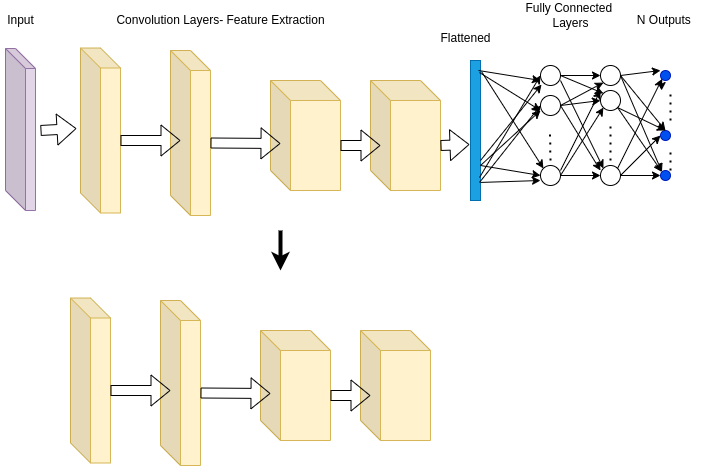

####**Add new trainable layers at the top of the network**

In our image network example, the added layers are dense layers, though it is possible to add convolution layers as well.

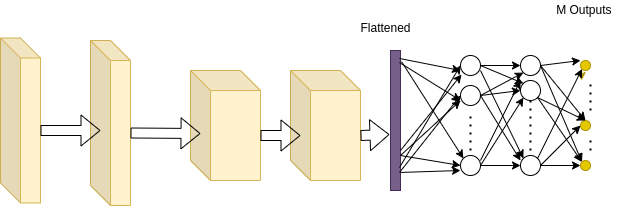

####**Freeze the transfered weights, trained the added new layers from scratch**


It is important to freeze the trained weights until the randomly intitialized untrained added layers are converged, since the new untrained layers will cause large gradient updates which will destroy trained weights.



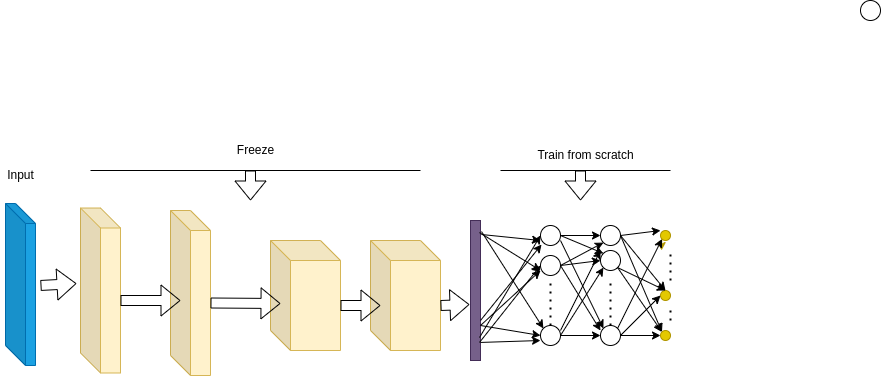

#### Fine Tuning

At this stage, the transferred layers - all of them or just part of them - may be unfreezed, and the model is retrained again. Since model is large, and dataset is probably small, model is very sensitive to overfitting, and should be trained with a very small training rate thus avoiding large updates.



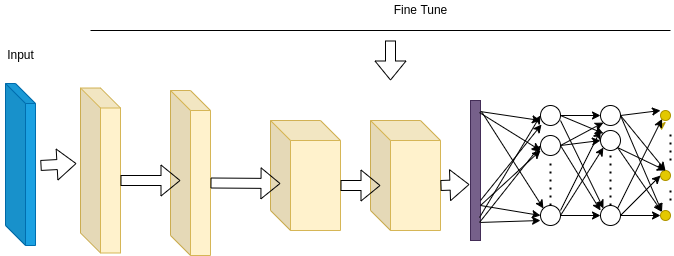

##  `trainable=False` vs `training=False`  

When freezing the updates of base model's weights, it is required to set `trainable`=`False`. Afte this stage is copleted, when reaching the fine-tuning stage, the weights updates should be permited by setting `trainable`=`True`.


Besides that, it is essential to prevent the adaptive changes of the Batchnorm coefficients. The `BatchNormalization` is not a trainable component, but its coefficient are updated during a Learning session, to normalize the data which pass through. Updating the `BatchNormalization` coefficients should be prevented in Transfer learning through the entire process. Otherwise, what was learned would be destroyed. To prevent this update set `training=False`  , which selects the Inference mode ver `Training` mode.






So here we go with the Transfer Learning example.

In [27]:
import tensorflow as tf
import tensorflow_hub as hub

import requests
import PIL
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np

import datetime
import os
import random
import pathlib

%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Link to model page in TF Hub - https://tfhub.dev/google/imagenet/resnet_v2_101/classification/4

In [28]:
labels_file = 'https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt'

downloaded_file = tf.keras.utils.get_file("labels.txt", origin=labels_file)

classes = []

with open(downloaded_file) as f:
  labels = f.readlines()
  classes = [l.strip() for l in labels]

##Download Base Model

####**Select a Base Model Network From A List**


####**Table of  Base Models**

- These are the base models which can be selected for execution in the transfer learning illustration which follows.



- The cell below consists of 2 tables:

    - **base_model_url_table** - Which holds the download url for each base 
    model.
    - **model_image_size_map** - which holds the required dimenssion of input images. **NOTE:**: The image input dimenssions in TF Hub model are Unmodifiable**

- All models are listed in TF HUB pages.


In [29]:
base_model_url_table = {
  "efficientnetv2-s": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_s/feature_vector/2",
  "efficientnetv2-m": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_m/feature_vector/2",
  "efficientnetv2-l": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_l/feature_vector/2",
  "efficientnetv2-s-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_s/feature_vector/2",
  "efficientnetv2-m-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_m/feature_vector/2",
  "efficientnetv2-l-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_l/feature_vector/2",
  "efficientnetv2-xl-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_xl/feature_vector/2",
  "efficientnetv2-b0-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b0/feature_vector/2",
  "efficientnetv2-b1-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b1/feature_vector/2",
  "efficientnetv2-b2-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b2/feature_vector/2",
  "efficientnetv2-b3-21k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b3/feature_vector/2",
  "efficientnetv2-s-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_s/feature_vector/2",
  "efficientnetv2-m-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_m/feature_vector/2",
  "efficientnetv2-l-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_l/feature_vector/2",
  "efficientnetv2-xl-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_xl/feature_vector/2",
  "efficientnetv2-b0-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b0/feature_vector/2",
  "efficientnetv2-b1-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b1/feature_vector/2",
  "efficientnetv2-b2-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b2/feature_vector/2",
  "efficientnetv2-b3-21k-ft1k": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_ft1k_b3/feature_vector/2",
  "efficientnetv2-b0": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b0/feature_vector/2",
  "efficientnetv2-b1": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b1/feature_vector/2",
  "efficientnetv2-b2": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b2/feature_vector/2",
  "efficientnetv2-b3": "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet1k_b3/feature_vector/2",
  "efficientnet_b0": "https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1",
  "efficientnet_b1": "https://tfhub.dev/tensorflow/efficientnet/b1/feature-vector/1",
  "efficientnet_b2": "https://tfhub.dev/tensorflow/efficientnet/b2/feature-vector/1",
  "efficientnet_b3": "https://tfhub.dev/tensorflow/efficientnet/b3/feature-vector/1",
  "efficientnet_b4": "https://tfhub.dev/tensorflow/efficientnet/b4/feature-vector/1",
  "efficientnet_b5": "https://tfhub.dev/tensorflow/efficientnet/b5/feature-vector/1",
  "efficientnet_b6": "https://tfhub.dev/tensorflow/efficientnet/b6/feature-vector/1",
  "efficientnet_b7": "https://tfhub.dev/tensorflow/efficientnet/b7/feature-vector/1",
  "bit_s-r50x1": "https://tfhub.dev/google/bit/s-r50x1/1",
  "inception_v3": "https://tfhub.dev/google/imagenet/inception_v3/feature-vector/4",
  "inception_resnet_v2": "https://tfhub.dev/google/imagenet/inception_resnet_v2/feature-vector/4",
  "resnet_v1_50": "https://tfhub.dev/google/imagenet/resnet_v1_50/feature-vector/4",
  "resnet_v1_101": "https://tfhub.dev/google/imagenet/resnet_v1_101/feature-vector/4",
  "resnet_vmodel_image_size_map1_152": "https://tfhub.dev/google/imagenet/resnet_v1_152/feature-vector/4",
  "resnet_v2_50": "https://tfhub.dev/google/imagenet/resnet_v2_50/feature-vector/4",
  "resnet_v2_101": "https://tfhub.dev/google/imagenet/resnet_v2_101/feature-vector/4",
  "resnet_v2_152": "https://tfhub.dev/google/imagenet/resnet_v2_152/feature-vector/4",
  "nasnet_large": "https://tfhub.dev/google/imagenet/nasnet_large/feature_vector/4",
  "nasnet_mobile": "https://tfhub.dev/google/imagenet/nasnet_mobile/feature_vector/4",
  "pnasnet_large": "https://tfhub.dev/google/imagenet/pnasnet_large/feature_vector/4",
  "mobilenet_v2_100_224": "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/4",
  "mobilenet_v2_130_224": "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4",
  "mobilenet_v2_140_224": "https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/feature_vector/4",
  "mobilenet_v3_small_100_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/feature_vector/5",
  "mobilenet_v3_small_075_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_small_075_224/feature_vector/5",
  "mobilenet_v3_large_100_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/feature_vector/5",
  "mobilenet_v3_large_075_224": "https://tfhub.dev/google/imagenet/mobilenet_v3_large_075_224/feature_vector/5",
}

model_image_size_map = {
  "efficientnetv2-s": 384,
  "efficientnetv2-m": 480,
  "efficientnetv2-l": 480,
  "efficientnetv2-b0": 224,
  "efficientnetv2-b1": 240,
  "efficientnetv2-b2": 260,
  "efficientnetv2-b3": 300,
  "efficientnetv2-s-21k": 384,
  "efficientnetv2-m-21k": 480,
  "efficientnetv2-l-21k": 480,
  "efficientnetv2-xl-21k": 512,
  "efficientnetv2-b0-21k": 224,
  "efficientnetv2-b1-21k": 240,
  "efficientnetv2-b2-21k": 260,
  "efficientnetv2-b3-21k": 300,
  "efficientnetv2-s-21k-ft1k": 384,
  "efficientnetv2-m-21k-ft1k": 480,
  "efficientnetv2-l-21k-ft1k": 480,
  "efficientnetv2-xl-21k-ft1k": 512,
  "efficientnetv2-b0-21k-ft1k": 224,
  "efficientnetv2-b1-21k-ft1k": 240,
  "efficientnetv2-b2-21k-ft1k": 260,
  "efficientnetv2-b3-21k-ft1k": 300, 
  "efficientnet_b0": 224,
  "efficientnet_b1": 240,
  "efficientnet_b2": 260,
  "efficientnet_b3": 300,
  "efficientnet_b4": 380,
  "efficientnet_b5": 456,
  "efficientnet_b6": 528,
  "efficientnet_b7": 600,
  "inception_v3": 299,
  "inception_resnet_v2": 299,
  "nasnet_large": 331,
  "pnasnet_large": 331,
}


In [30]:
#@title Select Base Model Name { run: "auto" }
base_model_name = "mobilenet_v2_140_224" # @param ['efficientnetv2-s', 'efficientnetv2-m', 'efficientnetv2-l', 'efficientnetv2-s-21k', 'efficientnetv2-m-21k', 'efficientnetv2-l-21k', 'efficientnetv2-xl-21k', 'efficientnetv2-b0-21k', 'efficientnetv2-b1-21k', 'efficientnetv2-b2-21k', 'efficientnetv2-b3-21k', 'efficientnetv2-s-21k-ft1k', 'efficientnetv2-m-21k-ft1k', 'efficientnetv2-l-21k-ft1k', 'efficientnetv2-xl-21k-ft1k', 'efficientnetv2-b0-21k-ft1k', 'efficientnetv2-b1-21k-ft1k', 'efficientnetv2-b2-21k-ft1k', 'efficientnetv2-b3-21k-ft1k', 'efficientnetv2-b0', 'efficientnetv2-b1', 'efficientnetv2-b2', 'efficientnetv2-b3', 'efficientnet_b0', 'efficientnet_b1', 'efficientnet_b2', 'efficientnet_b3', 'efficientnet_b4', 'efficientnet_b5', 'efficientnet_b6', 'efficientnet_b7', 'bit_s-r50x1', 'inception_v3', 'inception_resnet_v2', 'resnet_v1_50', 'resnet_v1_101', 'resnet_v1_152', 'resnet_v2_50', 'resnet_v2_101', 'resnet_v2_152', 'nasnet_large', 'nasnet_mobile', 'pnasnet_large', 'mobilenet_v2_100_224', 'mobilenet_v2_130_224', 'mobilenet_v2_140_224', 'mobilenet_v3_small_100_224', 'mobilenet_v3_small_075_224', 'mobilenet_v3_large_100_224', 'mobilenet_v3_large_075_224']


####**Load The Selected Base Model**

In [31]:
base_model_url = base_model_url_table[base_model_name]
base_model = hub.KerasLayer(base_model_url, trainable=False)

##Parameters Setup

In [32]:
#@title Set Batch Size
batch_size = 32 #@param {type:"integer"}

# Hard coded parameter:
num_of_image_channels = 3

# Set image dimenssions according to selected model
image_width = image_height = model_image_size_map.get(base_model_name, 224)

print("image_width: {image_width}".format(image_width=image_width))
print("image_height: {image_height}".format(image_height=image_height))


image_width: 224
image_height: 224


##**Download Data Images**

In [33]:
data_dir = tf.keras.utils.get_file(
    'flower_photos',
    'https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz',
    untar=True)

##**Present Info Of Downloaded Data**

####**Extract Class Names**

In [34]:
base_data_dir = pathlib.Path(data_dir)
subdir_names = np.array(sorted([item.name for item in base_data_dir.glob('*') if item.name != "LICENSE.txt"]))
print(subdir_names)

['daisy' 'dandelion' 'roses' 'sunflowers' 'tulips']


####**Show number of images per class**

In [35]:
file_ext = 'jpg'
class_dir_info = {}
for subdir_name in subdir_names:
  subdir = pathlib.Path(os.path.join(base_data_dir, subdir_name))
  files_count = len([file for file in os.listdir(subdir) if file.endswith(file_ext)])
  class_dir_info.update({'dir': subdir})
  print('{}: {} files'.format(subdir_name, files_count))

image_count = len(list(pathlib.Path(base_data_dir).glob('*/*.{}'.format(file_ext))))
print('total file count: {}'.format(image_count))

daisy: 633 files
dandelion: 898 files
roses: 641 files
sunflowers: 699 files
tulips: 799 files
total file count: 3670


####**Visualize downloaded images**


- Presented here before any transformation, in original size
- A row of images per each class category

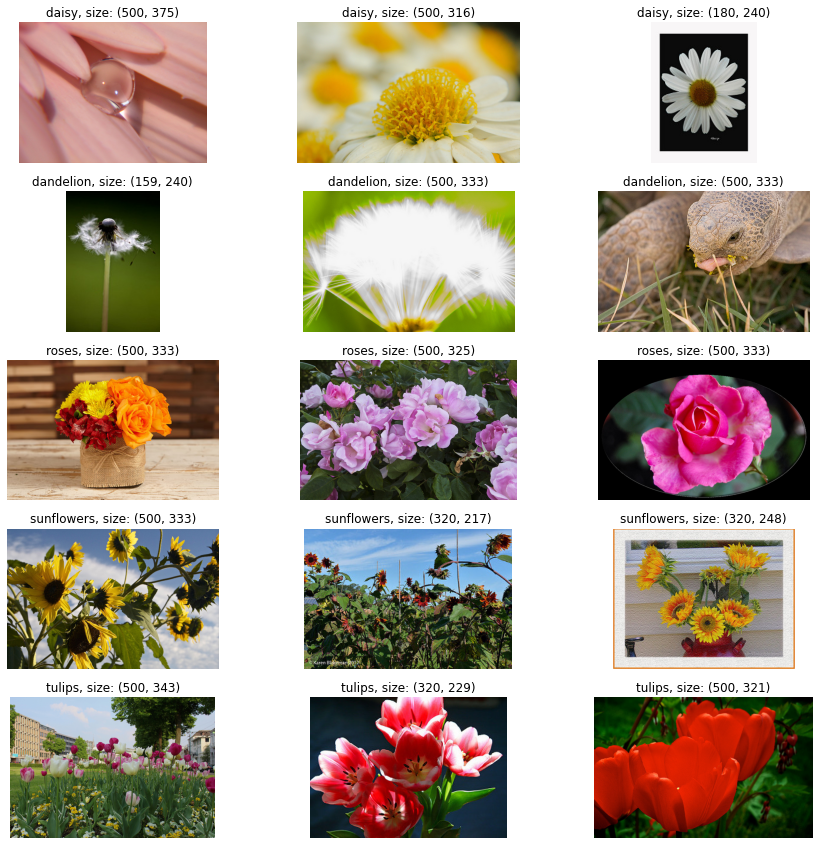

In [36]:

plt.figure(figsize=(15, 15))
n_dir_images_show = 3

for i, subdir_name in enumerate(subdir_names):
  path = pathlib.Path(os.path.join(base_data_dir, subdir_name))
  for j in range(n_dir_images_show):
    ax = plt.subplot(len(subdir_names), n_dir_images_show, i*n_dir_images_show+j+1)
    filename =random.choice(os.listdir(path))
    img = PIL.Image.open(os.path.join(path, filename))
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(subdir_names[i]+', size: '+str(img.size))


##**Build Input Pipeline**


####Create Datasets

In [37]:
def build_dataset(subset):
  return tf.keras.preprocessing.image_dataset_from_directory(
      data_dir,
      validation_split=0.2,
      subset=subset,
      label_mode="categorical",
      seed=41,
      image_size=(image_height, image_width),
      batch_size=32)

train_ds = build_dataset("training")
class_names = tuple(train_ds.class_names)

val_ds = build_dataset("validation")
val_ds = val_ds.skip(len(val_ds) // 5)
test_ds = val_ds.take(len(val_ds) // 5)

train_size = train_ds.cardinality().numpy()
valid_size = val_ds.cardinality().numpy()
test_size = test_ds.cardinality().numpy()

print('train batches:{train_size}\nbatches:{valid_size}\ntest batches:{test_size}\n'.format(train_size=train_size, valid_size=valid_size, test_size=test_size))


Found 3670 files belonging to 5 classes.
Using 2936 files for training.
Found 3670 files belonging to 5 classes.
Using 734 files for validation.
train batches:92
batches:19
test batches:3



####Visualize some batched images

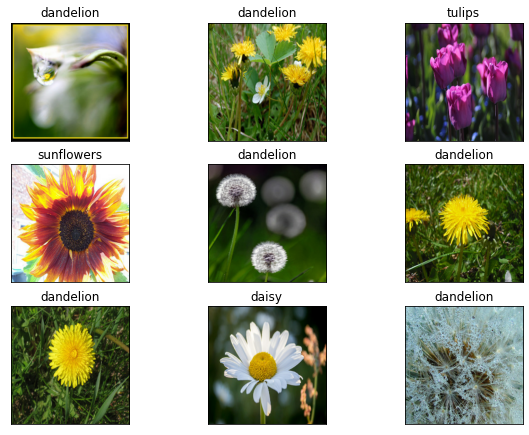

In [38]:
plt.figure(figsize=(10, 10))
image_batch, label_batch = next(iter(train_ds))

max_plots=9
for idx, (image, label) in enumerate(zip(image_batch, label_batch)):
  if idx >= max_plots:
    break
  ax = plt.subplot(3+1, max_plots//3, idx+1)
  ax.set_title(class_names[np.argmax(label)])
  plt.imshow(image/255)
  ax.set_xticks([])
  ax.set_yticks([])



####**Data Augmentation**

In [39]:
data_augmentation = tf.keras.Sequential()

do_data_augmentation = True #@param {type:"boolean"}
if do_data_augmentation:
  data_augmentation.add(
      tf.keras.layers.RandomRotation(40))
  data_augmentation.add(
      tf.keras.layers.RandomTranslation(0, 0.2))
  data_augmentation.add(
      tf.keras.layers.RandomTranslation(0.2, 0))
  data_augmentation.add(
      tf.keras.layers.RandomZoom(0.2, 0.2))
  data_augmentation.add(
      tf.keras.layers.RandomFlip(mode="horizontal"))

train_ds = train_ds.map(lambda images, labels:
                        (data_augmentation(images), labels))


####**Visualize Augmented Data**

Show an image with some augmented replicas

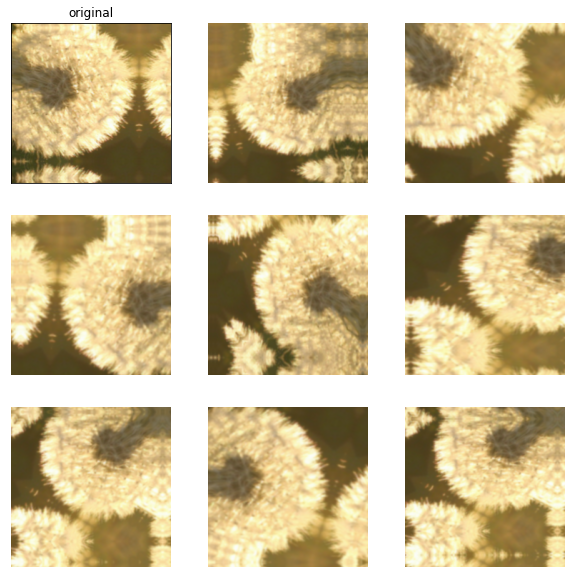

In [40]:
plt.figure(figsize=(10, 10))
image_batch, label_batch = next(iter(train_ds))

image = image_batch[random.randint(0, len(image_batch)-1)]
ax = plt.subplot(3, 3, 1)
ax.set_title('original')
plt.imshow(image/255)
ax.set_xticks([])
ax.set_yticks([])

for i in range(8):
  augmented_images = data_augmentation((tf.expand_dims(image, axis=0, name=None)))
  ax = plt.subplot(3, 3, i + 2)
  plt.imshow(augmented_images[0].numpy().astype("float32")/255)
  plt.axis("off")


##**Create The Model**



- Add an output layer on top of the base mode
- Add an imput and Rescaling layers (Those layers have no params)

In [41]:
do_fine_tuning = True #@param  {type:"boolean"}

num_of_image_channels = 3
inputs = tf.keras.Input(shape=(image_height, image_width, num_of_image_channels), name='input')
scale_layer = tf.keras.layers.Rescaling(scale=1 / 255)
x = scale_layer(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.Dropout(0.5, name='dropout')(x)
outputs = tf.keras.layers.Dense(len(class_names), name='output')(x)
model = tf.keras.Model(inputs, outputs)    


## **Build and Compile**

- At this cycle, the base model is freezed
- Learning rate is kept small

In [42]:

model.build((None, image_height, image_width, num_of_image_channels))
model.summary()


model.compile(
  optimizer='adam', 
  loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True, label_smoothing=0.1),
  metrics=['accuracy'])



Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input (InputLayer)          [(None, 224, 224, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 keras_layer_1 (KerasLayer)  (None, 1792)              4363712   
                                                                 
 dropout (Dropout)           (None, 1792)              0         
                                                                 
 output (Dense)              (None, 5)                 8965      
                                                                 
Total params: 4,372,677
Trainable params: 8,965
Non-trainable params: 4,363,712
_________________________________________________________________


#### **Notes on Printed The Model Summary Table** (Printed in the cell above)

the table shows that out of 4,372,677 parrams, shows that  8,965 are `Trainable params`.

Here's the number of `Trainable params` calculation:

 - Size of basic model output: 1792
 - Size of new ouput layer: 5
 - ->Total weights to calculate: **1792*5+5** = **8965**

##**Fit**

####**Set a TensorBoard Callback**

The callback creates and stores logs, which later will be used for Tensorboard's Metric Display


In [43]:
#@title Set Histogram  Calculation Step (in epochs)

histogram_freq =  1#@param {type:"integer"}

In [44]:
def set_tb_cb():
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_cb = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=histogram_freq) 
    return tensorboard_cb

####**Set Params**

In [45]:
#@title Set Number of Epochs for New Model Training (Base Model Trainable=False)
epochs =  10#@param {type:"integer"}

####**Do The Train**

In [46]:
tensorboard_cb = set_tb_cb()
history = model.fit(
    train_ds,
    epochs=epochs, 
    validation_data=val_ds,
    callbacks=[tensorboard_cb]
    )


Epoch 1/10
92/92 [==============================] - 228s 2s/step - loss: 1.2327 - accuracy: 0.6022 - val_loss: 0.7811 - val_accuracy: 0.8416
Epoch 2/10
92/92 [==============================] - 208s 2s/step - loss: 0.9075 - accuracy: 0.7677 - val_loss: 0.7290 - val_accuracy: 0.8614
Epoch 3/10
92/92 [==============================] - 223s 2s/step - loss: 0.8367 - accuracy: 0.8052 - val_loss: 0.7134 - val_accuracy: 0.8564
Epoch 4/10
92/92 [==============================] - 224s 2s/step - loss: 0.8352 - accuracy: 0.7970 - val_loss: 0.6943 - val_accuracy: 0.8762
Epoch 5/10
92/92 [==============================] - 224s 2s/step - loss: 0.7931 - accuracy: 0.8270 - val_loss: 0.6802 - val_accuracy: 0.8861
Epoch 6/10
92/92 [==============================] - 212s 2s/step - loss: 0.7633 - accuracy: 0.8430 - val_loss: 0.6710 - val_accuracy: 0.8878
Epoch 7/10
92/92 [==============================] - 225s 2s/step - loss: 0.7598 - accuracy: 0.8406 - val_loss: 0.6596 - val_accuracy: 0.8894
Epoch 8/10
92

##**Visualize Training Results**
---

Demonstrating 2 options for visualizing output metrics:

Note: Validation results are sometimes better than Train results.

Possible reasons:

- Validation is a smaller dataset, maybe it happens to hold an 'easier' data
- Validation is calculated after epoch ends, and coefficients and batch normalization coeffs are all set already.


#####Plot Metrics using `history`

In [47]:
def show_metrics(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs_range = history.epoch

  plt.figure(figsize=(8, 8))
  plt.subplot(1, 2, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')
  plt.ylabel("Accuracy (training and validation)")
  plt.xlabel("Training Steps")

  plt.subplot(1, 2, 2)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.ylabel("Loss (training and validation)")

  plt.xlabel("Training Steps")
  plt.show()



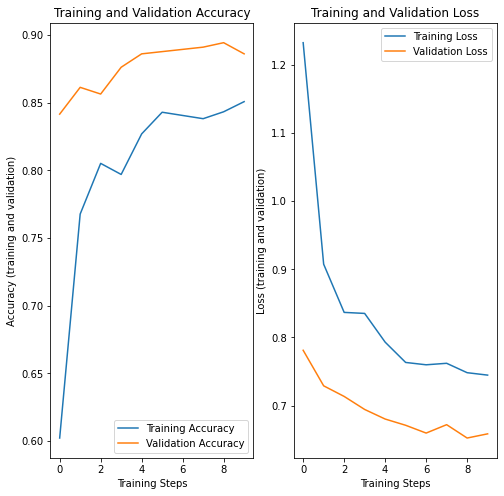

In [48]:
show_metrics(history)

#####Plot Metrics using `TensorBoard`

In [49]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 400), started 1:02:13 ago. (Use '!kill 400' to kill it.)

<IPython.core.display.Javascript object>

##**A Second Training Cycle**

- On the first cycle, the base model was freezed.

- Now unfreeze the base model and take another fine-tuning train cycle of the entire model

  - Set base_model.trainable = True

- To avoid updates of `BatchNormalization` coefficients, we set training=False, so the model will update weights but will actually run on Inference mode.

####**Set model params**

In [50]:
base_model.trainable = True

####**Compile**

Must Re-compile to set new training parametes:
- Optimizer
- Learning Rate
- Set base_model.trainable = True

In [51]:

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5), 
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

####**Model Summary**

In [52]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input (InputLayer)          [(None, 224, 224, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 keras_layer_1 (KerasLayer)  (None, 1792)              4363712   
                                                                 
 dropout (Dropout)           (None, 1792)              0         
                                                                 
 output (Dense)              (None, 5)                 8965      
                                                                 
Total params: 4,372,677
Trainable params: 4,324,741
Non-trainable params: 47,936
_________________________________________________________________


####**Set Fit Params**





In [53]:
#@title Set Number of Epochs for End-To-End Fine Tune Training

epochs = 10 #@param {type:"integer"}

####**Set the TensorFlow Callback**

In [54]:
tensorboard_cb_fine_tune = set_tb_cb()

####**Fit - Fine Tune Cycle**

In [55]:
fine_tune_results = model.fit(
          train_ds,
          epochs=epochs, 
          validation_data=val_ds,
          callbacks=[tensorboard_cb_fine_tune]
        )


Epoch 1/10
92/92 [==============================] - 758s 8s/step - loss: 0.4691 - binary_accuracy: 0.9249 - val_loss: 0.3794 - val_binary_accuracy: 0.9436
Epoch 2/10
92/92 [==============================] - 739s 8s/step - loss: 0.3869 - binary_accuracy: 0.9362 - val_loss: 0.3409 - val_binary_accuracy: 0.9469
Epoch 3/10
92/92 [==============================] - 751s 8s/step - loss: 0.3660 - binary_accuracy: 0.9372 - val_loss: 0.3357 - val_binary_accuracy: 0.9403
Epoch 4/10
92/92 [==============================] - 753s 8s/step - loss: 0.3237 - binary_accuracy: 0.9424 - val_loss: 0.3455 - val_binary_accuracy: 0.9370
Epoch 5/10
92/92 [==============================] - 737s 8s/step - loss: 0.3029 - binary_accuracy: 0.9408 - val_loss: 0.3331 - val_binary_accuracy: 0.9399
Epoch 6/10
92/92 [==============================] - 771s 8s/step - loss: 0.3069 - binary_accuracy: 0.9396 - val_loss: 0.3036 - val_binary_accuracy: 0.9330
Epoch 7/10
92/92 [==============================] - 797s 9s/step - los

##**Metrics Visualizations of Fine-Tune Training**

Plotted below are both python plots and TensorBoard metric plots

#### Metric Plots

In [59]:
!rm -rf logs

In [56]:
show_metrics(fine_tune_results)

KeyError: ignored

#### TensorBoard Metric Plots

In [ ]:
%tensorboard --logdir logs/fit

**The Fine-tune cycle gained a nice improvement!**

##**Inference**

####Evalualte with Test Dataset

Evaluate outputs result metrics

In [ ]:
results = model.evaluate(test_ds)
print(f'Test {model.metrics_names[0]}: {results[0]}: Test {model.metrics_names[1]}: {results[1]}')

####Predict with Test Dataset

In [ ]:
image_batch, labels_batch = next(iter(test_ds))
results = model.predict(image_batch)


####**Present Some Prediction Results**

**Note:**

- Blue plot title: correct prediction
- Bed plot title:  wrong prediction

In [ ]:
fig, axes = plt.subplots(nrows=6, ncols=6, sharex=True)
fig.set_figheight(20)
fig.set_figwidth(20)

plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[]);

for  idx, (image, label, result) in enumerate(zip(image_batch, labels_batch, results)):
  axes.flat[idx].imshow(image/255)
  axes.flat[idx].set_xticks([])
  axes.flat[idx].set_yticks([])
  error = False if np.argmax(result) == np.argmax(label) else True
  color = 'red' if error else 'blue'
  probability = (tf.nn.softmax(result).numpy()[np.argmax(result)]*100)
  axes.flat[idx].set_title("{} {} {:.2f}% ".format(idx + 1, 
                                          class_names[np.argmax(result)], probability), 
                           color=color
  )   

In [ ]:
from google.colab import files
model.save('mtransfer_learning.h5')
files.download('mtransfer_learning.h5') 